In [1]:
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import animation, rc
from mpl_toolkits.mplot3d import Axes3D

import copy

rc('animation', html='jshtml')
rc('savefig', dpi=100, format='svg')

## Generate  Dataset

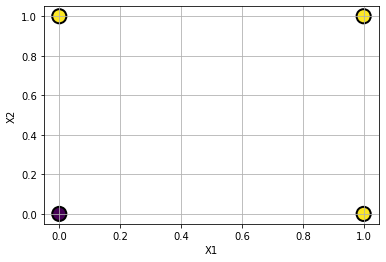

In [4]:
T = 1.
F = 0.

## OR GATE
xx = [[1, F, F],
      [1, F, T],
      [1, T, F],
      [1, T, T]]
yy = [F,
      T,
      T,
      T]

XX = np.array(xx)
target = np.array(yy)

%matplotlib inline
plt.scatter(XX[:,1], XX[:,2], c=target, s=200, edgecolors='k', lw=2)
plt.grid()
plt.xlabel("X1")
plt.ylabel("X2")
plt.show()

# Mcculloch and Pitts Neuron

## Define Function and Error

In [5]:
def step_function(x):
    return float(x>0)

def output(X, W):
    z = (X*W).sum()
    y = step_function(z)
    return y

def error(all_y, all_t):
    err = np.sum(np.abs(all_y - all_t))
    return err

In [6]:
np.random.seed(152)
num_search = 1000
min_error = 9e9
best_W = None
for i in range(num_search):
    ## Randomly sample Weights (W)
    W = np.random.uniform(-1,1, size=3)
    
    ## Compute output for all input with given Weight(W)
    y_list = []
    for j in range(len(XX)):
        X = XX[j]
        y = output(X, W)
        y_list.append(y)
    
    ## Measure error for given Weight(W)
    err = error(np.array(y_list), target)
    
    ## Store the weight with least error
    if err < min_error:
        print(i)
        min_error = err
        best_W = W

0
5
8


In [7]:
best_W, min_error

(array([-0.38648052,  0.98411751,  0.83514184]), 0.0)

## Plot the 3D function

In [8]:
num_points = 500
X1s = np.linspace(-0.2, 1.2, num_points)  ## for mesh grid
X2s = np.linspace(-0.2, 1.2, num_points)

x1g, x2g = np.meshgrid(X1s, X2s)

In [9]:
yg = [output(np.array([1, x1_, x2_]), best_W) for x1_, x2_ in zip(np.ravel(x1g), np.ravel(x2g))]
yg = np.array(yg).reshape(x1g.shape)

Text(0.5, 0, 'Y')

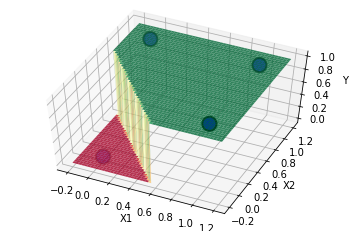

In [10]:
%matplotlib inline
fig = plt.figure()
ax = fig.gca(projection='3d')
azimuth, elev = -65, 55
ax.view_init(elev, azimuth )


ax.scatter(XX[:,1], XX[:,2], target, c='b', s=200, edgecolors='k', lw=2, cmap="bwr")
ax.plot_surface(x1g, x2g, yg, alpha=0.8, cmap='RdYlGn')
ax.set_xlabel('X1')
ax.set_ylabel('X2')
ax.set_zlabel('Y')

# plt.savefig("random_search.png", dpi=100, format='png')

### Plot in 2D

Text(0, 0.5, 'X2')

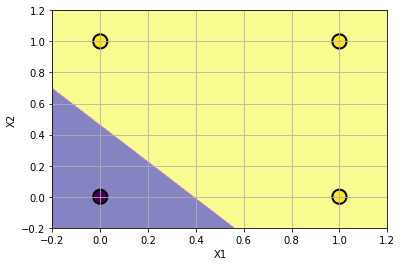

In [11]:
plt.imshow(yg.reshape(x1g.shape), interpolation='bilinear',
           extent=(x1g.min(), x1g.max(), x2g.min(), x2g.max()),
           cmap='plasma',
           alpha=0.5,
           aspect='auto', origin='lower')

plt.scatter(XX[:,1], XX[:,2], c=target, s=200, edgecolors='k', lw=2)
plt.grid()
plt.xlabel("X1")
plt.ylabel("X2")

# plt.savefig("OR-Gate-2D_random_search.png", dpi=100, format='png')

# Hebbian Learning

For Hebbian Learning to work,   
The Boolean logics must be represented as:    
    * True(T) = 1   
    * False(F) = -1 (instead of zero '0')

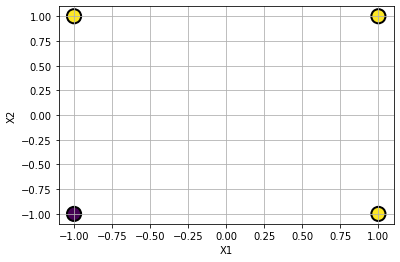

In [12]:
T = 1.
F = -1.

xx = [[1, F, F],
      [1, F, T],
      [1, T, F],
      [1, T, T]]

## OR GATE
yy = [F,
      T,
      T,
      T]

## AND GATE
# yy = [F,
#       F,
#       F,
#       T]

## NAND GATE
# yy = [T,
#       T,
#       T,
#       F]

XX = np.array(xx)
target = np.array(yy)

%matplotlib inline
plt.scatter(XX[:,1], XX[:,2], c=target, s=200, edgecolors='k', lw=2)
plt.grid()
plt.xlabel("X1")
plt.ylabel("X2")
plt.show()

In [13]:
## function that measures similarity of Input and target
def similarity(X, t):
#     same = np.where(X==t, 1., -1.)
    same = X*t
    return same

def output_hebb(X, W):
    return np.sign((W*X).sum())

In [14]:
## Initialize Weights
np.random.seed(123)
# W = np.zeros(3)
W = np.random.randn(3)

In [15]:
### Train for some steps:
steps = 4
for j in range(steps):
    i = j%4
    y_list = []
    
    X = XX[i]
    t = target[i]

    dW = similarity(X, t)
    W = W + dW
    
print("Weight (W)", W)

Weight (W) [0.9143694  2.99734545 2.2829785 ]


In [16]:
all_y = []
for i in range(len(XX)):
    X = XX[i]
    ## Compute output for learned weight
    y = output_hebb(X, W)
    all_y.append(y)
all_y = np.array(all_y)
all_y

array([-1.,  1.,  1.,  1.])

In [17]:
num_points = 200
X1s = np.linspace(-1.2, 1.2, num_points)  ## for mesh grid
X2s = np.linspace(-1.2, 1.2, num_points)

x1g, x2g = np.meshgrid(X1s, X2s)

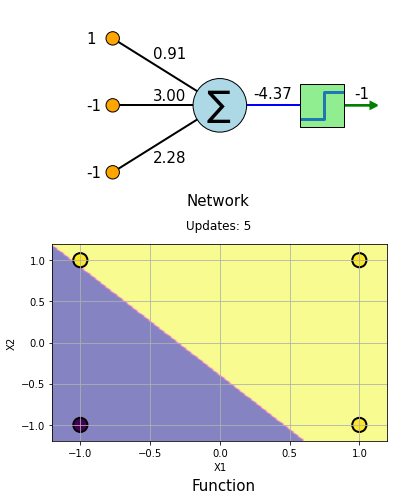

In [18]:
##It needs W, X

X= XX[0].astype(int)
weighted_sum = (X*W).sum()
y = int(output_hebb(X,W))

fig = plt.figure(figsize=(6, 8))
ax = fig.add_subplot(2, 1, 1)
ax2 = fig.add_subplot(2, 1, 2)

# fig = plt.figure(figsize=(6, 4))
# ax = fig.add_subplot(1, 1, 1)

ax.axis('equal')
ax.axis([0, 1, 0, 1])

## Summation
circle = plt.Circle((0.5, 0.5), 0.08, color='lightblue', ec='k')
ax.add_artist(circle)
ax.text(0.46,0.47, r"$\sum$", fontsize=25)

### Step function
square = plt.Rectangle((0.74, 0.435), 0.13, 0.13, color='lightgreen', ec='k' )
ax.add_artist(square)

step_funcx = [0.745, 0.81, 0.81, 0.865]
step_funcy = [0.46, 0.46, 0.54, 0.54]
ax.plot(step_funcx, step_funcy, lw=3)

### Inputs

c0 = plt.Circle((0.18, 0.7), 0.02, color='orange', ec='k')
c1 = plt.Circle((0.18, 0.5), 0.02, color='orange', ec='k')
c2 = plt.Circle((0.18, 0.3), 0.02, color='orange', ec='k')

ax.add_artist(c0)
ax.add_artist(c1)
ax.add_artist(c2)

ax.text(0.1, 0.7-0.015, s=f"{X[0]}", fontsize=15)
ax.text(0.1, 0.5-0.015, s=f"{X[1]}", fontsize=15)
ax.text(0.1, 0.3-0.015, s=f"{X[2]}", fontsize=15)

## Weighted sum value

ax.plot([0.58, 0.74], [0.5, 0.5], lw=2, color='b', zorder=-1)
ax.text(0.6, 0.52, f"{weighted_sum:.2f}", fontsize=15)

## Output with arrow

ax.arrow(0.87, 0.5, 0.1, 0, length_includes_head=True,
         head_width=0.02, head_length=0.02, color='g', lw=2, zorder=-1)
ax.text(0.9, 0.52, f"{y}", fontsize=15)

## Weights

ax.plot([0.18, 0.5], [0.7, 0.5], lw=2, color='k', zorder=-1)
ax.plot([0.18, 0.5], [0.5, 0.5], lw=2, color='k', zorder=-1)
ax.plot([0.18, 0.5], [0.3, 0.5], lw=2, color='k', zorder=-1)

ax.text(0.3, 0.64, f"{W[0]:.2f}", fontsize=15)
ax.text(0.3, 0.515, f"{W[1]:.2f}", fontsize=15)
ax.text(0.3, 0.33, f"{W[2]:.2f}", fontsize=15)

ax.text(0.4, 0.2, "Network", fontsize=15)
ax.axis('off')

ax.text(0.4, 0.13, f"Updates: {5}", fontsize=12)


## Plot the function/decision boundary in 2D
yg = [output(np.array([1, x1_, x2_]), W) for x1_, x2_ in zip(np.ravel(x1g), np.ravel(x2g))]
yg = np.array(yg).reshape(x1g.shape)

ax2.imshow(yg.reshape(x1g.shape), interpolation='bicubic',
           extent=(x1g.min(), x1g.max(), x2g.min(), x2g.max()),
           cmap='plasma',
           alpha=0.5,
           aspect='auto', origin='lower')

ax2.scatter(XX[:,1], XX[:,2], c=target, s=200, edgecolors='k', lw=2)
ax2.grid()
ax2.set_xlabel("X1")
ax2.set_ylabel("X2")

ax2.text(-0.2, -1.8, "Function", fontsize=15)

plt.show()

In [91]:
### Animation of Hebbian Learning

fig = plt.figure(figsize=(6, 8))
ax = fig.add_subplot(2, 1, 1)
ax2 = fig.add_subplot(2, 1, 2)

plt.close()

def animate(i):
    global W
    print(f'Step {i}')
    
    if i==0:
        W = np.zeros(3)
#         W = -np.ones(3)
#         W = np.array([0,1,0])
#         np.random.seed(123)
#         W = np.random.randn(3)/9
        X = [0,0,0]
        weighted_sum = 0.0
        y = 0
    else:
        j = (i+1)%4
        X= XX[j].astype(int)
        t = target[j]

        dW = similarity(X, t)
        W = W + dW

        weighted_sum = (X*W).sum()
        y = int(output_hebb(X,W))

    ax.clear()
    ax2.clear()
    
    ax.axis('equal')
    ax.axis([0, 1, 0, 1])

    ## Summation
    circle = plt.Circle((0.5, 0.5), 0.08, color='lightblue', ec='k')
    ax.add_artist(circle)
    ax.text(0.46,0.47, r"$\sum$", fontsize=25)

    ### Step function
    square = plt.Rectangle((0.74, 0.435), 0.13, 0.13, color='lightgreen', ec='k' )
    ax.add_artist(square)

    step_funcx = [0.745, 0.81, 0.81, 0.865]
    step_funcy = [0.46, 0.46, 0.54, 0.54]
    ax.plot(step_funcx, step_funcy, lw=3)

    ### Inputs

    c0 = plt.Circle((0.18, 0.7), 0.02, color='orange', ec='k')
    c1 = plt.Circle((0.18, 0.5), 0.02, color='orange', ec='k')
    c2 = plt.Circle((0.18, 0.3), 0.02, color='orange', ec='k')

    ax.add_artist(c0)
    ax.add_artist(c1)
    ax.add_artist(c2)

    ax.text(0.1, 0.7-0.015, s=f"{X[0]}", fontsize=15)
    ax.text(0.1, 0.5-0.015, s=f"{X[1]}", fontsize=15)
    ax.text(0.1, 0.3-0.015, s=f"{X[2]}", fontsize=15)

    ## Weighted sum value

    ax.plot([0.58, 0.74], [0.5, 0.5], lw=2, color='b', zorder=-1)
    ax.text(0.6, 0.52, f"{weighted_sum:.2f}", fontsize=15)

    ## Output with arrow

    ax.arrow(0.87, 0.5, 0.1, 0, length_includes_head=True,
             head_width=0.02, head_length=0.02, color='g', lw=2, zorder=-1)
    ax.text(0.9, 0.52, f"{y}", fontsize=15)

    ## Weights

    ax.plot([0.18, 0.5], [0.7, 0.5], lw=2, color='k', zorder=-1)
    ax.plot([0.18, 0.5], [0.5, 0.5], lw=2, color='k', zorder=-1)
    ax.plot([0.18, 0.5], [0.3, 0.5], lw=2, color='k', zorder=-1)

    ax.text(0.3, 0.64, f"{W[0]:.2f}", fontsize=15)
    ax.text(0.3, 0.515, f"{W[1]:.2f}", fontsize=15)
    ax.text(0.3, 0.33, f"{W[2]:.2f}", fontsize=15)

    ax.text(0.4, 0.2, "Network", fontsize=15)
    ax.axis('off')
    
    ax.text(0.4, 0.13, f"Updates: {i}", fontsize=12)

    


    ## Plot the function/decision boundary in 2D
    yg = [output(np.array([1, x1_, x2_]), W) for x1_, x2_ in zip(np.ravel(x1g), np.ravel(x2g))]
    yg = np.array(yg).reshape(x1g.shape)

    ax2.imshow(yg.reshape(x1g.shape), interpolation='bicubic',
               extent=(x1g.min(), x1g.max(), x2g.min(), x2g.max()),
               cmap='plasma',
               alpha=0.5,
               aspect='auto', origin='lower')

    ax2.scatter(XX[:,1], XX[:,2], c=target, s=200, edgecolors='k', lw=2)
    ax2.grid()
    ax2.set_xlabel("X1")
    ax2.set_ylabel("X2")

    ax2.text(-0.2, -1.8, "Function", fontsize=15)
    
    

        
anim = animation.FuncAnimation(fig, animate,frames=9, init_func=lambda:None, interval=1000)

In [92]:
anim

Step 0
Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8


In [93]:
# writer_gif = animation.ImageMagickWriter(fps=1)
# anim.save('Hebbian_network_learning.gif', writer=writer_gif, dpi=100)

Step 0
Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8


# Perceptron

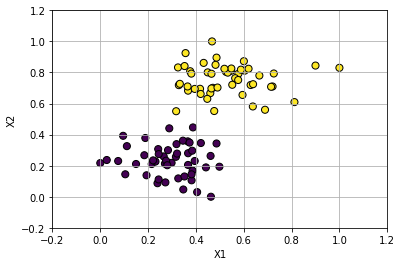

In [2]:
from sklearn.datasets import make_blobs

np.random.seed(2)
# xx, y = make_blobs(n_samples=100, centers=2, n_features=2, cluster_std=2.5)
xx, y = make_blobs(n_samples=100, centers=2, n_features=2, cluster_std=1.5)

x1 = xx[:,0]
x2 = xx[:,1]
tt = y.reshape(-1)

## MinMax Normalization
x1 = (x1-x1.min())/(x1.max()-x1.min())
x2 = (x2-x2.min())/(x2.max()-x2.min())
xx = np.column_stack((np.ones_like(x1), x1,x2))

%matplotlib inline
plt.scatter(x1, x2, c=tt, s=50, edgecolors='k', lw=1)
(x1min, x1max) = -0.2, 1.2
plt.xlim((x1min, x1max))
plt.ylim((x1min, x1max))
plt.xlabel("X1")
plt.ylabel('X2')
plt.grid()
plt.show()

In [3]:
def step_function(x):
    return float(x>0)

def output(X, W):
    z = (X*W).sum()
    y = step_function(z)
    return y

def error(all_y, all_t):
    err = np.sum(np.abs(all_y - all_t))
    return err

def total_error(XX, W, all_t):
    all_y = []
    for x in XX:
        y = output(x, W)
        all_y.append(y)
    all_y = np.array(all_y)
    err = error(all_y, all_t)
    
    err_indx = np.nonzero(all_y - all_t)[0]
    return err, err_indx
    

def update(W, X, y, t, learning_rate=0.1):
    delW = (t-y)
    new_W = W + learning_rate*delW*X
    return new_W

In [4]:
# %matplotlib tk
# fig = plt.figure()
# ax = fig.add_subplot(111)

## Initialize weights
np.random.seed(1)
W = np.random.randn(3)

## sample points which makes mistake
## THis helps faster convergence... also better animation :D

err_indx = np.arange(0, len(xx), dtype=np.int64)

val_list = []
for step in range(1000):
    indx = err_indx[np.random.randint(len(err_indx))]
    X = xx[indx]
    t = tt[indx]
    
    y = output(X, W)
    W = update(W, X, y, t)
    
    err, err_indx  = total_error(xx, W, tt)
    if step%10 == 0 or len(err_indx)==0:
        
        val_list.append((step, W, err))
        print(f"Step: {step} -> Error: {err}")

#         ax.clear()
#         ax.scatter(x1, x2, c=tt)#, ec='k')
#         ax.scatter(x1, x2, c=tt, marker='+')
        
#         #### plot decision boundary
#         ax.set_xlim((x1.min()-0.1, x1.max()+0.1))
#         ax.set_ylim((x2.min()-0.1, x2.max()+0.1))

#         (x1min, x1max) = ax.get_xlim()
#         x2min = (-W[0] - W[1]*x1min)/W[2]
#         x2max = (-W[0] - W[1]*x1max)/W[2]
#         ax.plot([x1min, x1max], [x2min, x2max], lw=3)

#         fig.canvas.draw()
#         plt.pause(0.01)
        print()
    
        if err < 1:
            print('fitted to our expectation')
            break

Step: 0 -> Error: 50.0

Step: 10 -> Error: 61.0

Step: 20 -> Error: 96.0

Step: 30 -> Error: 78.0

Step: 40 -> Error: 84.0

Step: 50 -> Error: 60.0

Step: 60 -> Error: 48.0

Step: 70 -> Error: 13.0

Step: 80 -> Error: 5.0

Step: 84 -> Error: 0.0

fitted to our expectation


In [5]:
val_list

[(0, array([ 1.52434536, -0.64993171, -0.53874517]), 50.0),
 (10, array([ 0.92434536, -0.76902776, -0.57311065]), 61.0),
 (20, array([ 0.52434536, -0.8514627 , -0.51724486]), 96.0),
 (30, array([ 0.32434536, -0.79031781, -0.32882956]), 78.0),
 (40, array([ 0.32434536, -0.6942773 , -0.03406519]), 84.0),
 (50, array([ 0.12434536, -0.6380363 ,  0.12121245]), 60.0),
 (60, array([ 0.12434536, -0.39977985,  0.39789706]), 48.0),
 (70, array([-0.07565464, -0.30691133,  0.54170587]), 13.0),
 (80, array([-0.27565464, -0.18463969,  0.60086099]), 5.0),
 (84, array([-0.27565464, -0.05680744,  0.65262086]), 0.0)]

## Animate perceptron

In [133]:
# to pause animation at final solution (3 frames in total)
val_list_anim = copy.deepcopy(val_list)
for _ in range(2):
    val_list_anim.append(val_list_anim[-1])

In [134]:
num_points = 200
X1s = np.linspace(-0.2, 1.2, num_points)  ## for mesh grid
X2s = np.linspace(-0.2, 1.2, num_points)

x1g, x2g = np.meshgrid(X1s, X2s)

In [135]:
### Animation of Hebbian Learning
%matplotlib inline
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
plt.close()

def animate(i):
    global val_list
    print(f'Step {i}')
    
    step, W, err = val_list_anim[i] 
    
    ## Plot the function/decision boundary in 2D
    yg = [output(np.array([1, x1_, x2_]), W) for x1_, x2_ in zip(np.ravel(x1g), np.ravel(x2g))]
    yg = np.array(yg).reshape(x1g.shape)

    ax.clear()
    ax.imshow(yg.reshape(x1g.shape), interpolation='bicubic',
               extent=(x1g.min(), x1g.max(), x2g.min(), x2g.max()),
               cmap='plasma',
               alpha=0.5,
               aspect='auto', origin='lower')

    ax.scatter(x1, x2, c=tt, s=50, edgecolors='k', lw=1)
    
    ## Plot decision boundary as line
    (x1min, x1max) = -0.2, 1.2
    x2min = (-W[0] - W[1]*x1min)/W[2]
    x2max = (-W[0] - W[1]*x1max)/W[2]
    ax.plot([x1min, x1max], [x2min, x2max], lw=3, color='g')
    ax.set_xlim((x1min, x1max))
    ax.set_ylim((x1min, x1max))
    
    ax.grid()
    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.text(0.2,1.23, f"Steps: {step}  Error: {int(err)}")

        
anim = animation.FuncAnimation(fig, animate,frames=len(val_list_anim),
                               init_func=lambda:None, interval=1000)

In [136]:
anim

Step 0
Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8
Step 9
Step 10
Step 11


In [137]:
writer_gif = animation.ImageMagickWriter(fps=1)
anim.save('Perceptron_learning.gif', writer=writer_gif, dpi=100)

Step 0
Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8
Step 9
Step 10
Step 11


## Noisy data with Perceptron

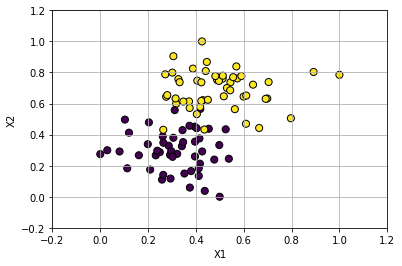

In [6]:
from sklearn.datasets import make_blobs

np.random.seed(2)
xx, y = make_blobs(n_samples=100, centers=2, n_features=2, cluster_std=2.5)
# xx, y = make_blobs(n_samples=100, centers=2, n_features=2, cluster_std=1.5)

x1 = xx[:,0]
x2 = xx[:,1]
tt = y.reshape(-1)

## MinMax Normalization
x1 = (x1-x1.min())/(x1.max()-x1.min())
x2 = (x2-x2.min())/(x2.max()-x2.min())
xx = np.column_stack((np.ones_like(x1), x1,x2))

%matplotlib inline
plt.scatter(x1, x2, c=tt, s=50, edgecolors='k', lw=1)
(x1min, x1max) = -0.2, 1.2
plt.xlim((x1min, x1max))
plt.ylim((x1min, x1max))
plt.xlabel("X1")
plt.ylabel('X2')
plt.grid()
plt.show()

In [19]:
# %matplotlib tk
# fig = plt.figure()
# ax = fig.add_subplot(111)

## Initialize weights
np.random.seed(1)
W = np.random.randn(3)

## sample points which makes mistake
## THis helps faster convergence... also better animation :D

err_indx = np.arange(0, len(xx), dtype=np.int64)

val_list = []
for step in range(1000):
    indx = err_indx[np.random.randint(len(err_indx))]
    X = xx[indx]
    t = tt[indx]
    
    y = output(X, W)
    W = update(W, X, y, t, 0.05)
    
    err, err_indx  = total_error(xx, W, tt)
    if step%10 == 0 or len(err_indx)==0:
        
        val_list.append((step, W, err))
        print(f"Step: {step} -> Error: {err}")

#         ax.clear()
#         ax.scatter(x1, x2, c=tt, s=50, edgecolors='k', lw=1)
        
#         #### plot decision boundary
#         ax.set_xlim((x1.min()-0.1, x1.max()+0.1))
#         ax.set_ylim((x2.min()-0.1, x2.max()+0.1))

#         (x1min, x1max) = ax.get_xlim()
#         x2min = (-W[0] - W[1]*x1min)/W[2]
#         x2max = (-W[0] - W[1]*x1max)/W[2]
#         ax.plot([x1min, x1max], [x2min, x2max], lw=3)

#         fig.canvas.draw()
#         plt.pause(0.01)
        
        print()
        if err < 1:
            print('fitted to our expectation')
            break

Step: 0 -> Error: 50.0

Step: 10 -> Error: 52.0

Step: 20 -> Error: 74.0

Step: 30 -> Error: 87.0

Step: 40 -> Error: 93.0

Step: 50 -> Error: 60.0

Step: 60 -> Error: 69.0

Step: 70 -> Error: 78.0

Step: 80 -> Error: 81.0

Step: 90 -> Error: 71.0

Step: 100 -> Error: 62.0

Step: 110 -> Error: 67.0

Step: 120 -> Error: 62.0

Step: 130 -> Error: 49.0

Step: 140 -> Error: 51.0

Step: 150 -> Error: 24.0

Step: 160 -> Error: 34.0

Step: 170 -> Error: 21.0

Step: 180 -> Error: 13.0

Step: 190 -> Error: 40.0

Step: 200 -> Error: 21.0

Step: 210 -> Error: 7.0

Step: 220 -> Error: 5.0

Step: 230 -> Error: 4.0

Step: 240 -> Error: 4.0

Step: 250 -> Error: 5.0

Step: 260 -> Error: 5.0

Step: 270 -> Error: 8.0

Step: 280 -> Error: 10.0

Step: 290 -> Error: 8.0

Step: 300 -> Error: 8.0

Step: 310 -> Error: 10.0

Step: 320 -> Error: 10.0

Step: 330 -> Error: 11.0

Step: 340 -> Error: 11.0

Step: 350 -> Error: 11.0

Step: 360 -> Error: 11.0

Step: 370 -> Error: 11.0

Step: 380 -> Error: 28.0

Step: 

In [20]:
len(val_list)

100

### Animate

In [10]:
num_points = 200
X1s = np.linspace(-0.2, 1.2, num_points)  ## for mesh grid
X2s = np.linspace(-0.2, 1.2, num_points)

x1g, x2g = np.meshgrid(X1s, X2s)

In [17]:
### Animation of Hebbian Learning
%matplotlib inline
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
plt.close()

def animate(i):
    global val_list
    if i%10 == 0:
        print(f'Step {i}')
    
    step, W, err = val_list[i] 
    
    ## Plot the function/decision boundary in 2D
    yg = [output(np.array([1, x1_, x2_]), W) for x1_, x2_ in zip(np.ravel(x1g), np.ravel(x2g))]
    yg = np.array(yg).reshape(x1g.shape)

    ax.clear()
    ax.imshow(yg.reshape(x1g.shape), interpolation='bicubic',
               extent=(x1g.min(), x1g.max(), x2g.min(), x2g.max()),
               cmap='plasma',
               alpha=0.5,
               aspect='auto', origin='lower')

    ax.scatter(x1, x2, c=tt, s=50, edgecolors='k', lw=1)
    
    ## Plot decision boundary as line
    (x1min, x1max) = -0.2, 1.2
    x2min = (-W[0] - W[1]*x1min)/W[2]
    x2max = (-W[0] - W[1]*x1max)/W[2]
    ax.plot([x1min, x1max], [x2min, x2max], lw=3, color='g')
    ax.set_xlim((x1min, x1max))
    ax.set_ylim((x1min, x1max))
    
    ax.grid()
    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.text(0.2,1.23, f"Steps: {step}  Error: {int(err)}")

        
anim = animation.FuncAnimation(fig, animate,frames=len(val_list),
                               init_func=lambda:None, interval=100)

In [18]:
anim

Step 0
Step 10
Step 20
Step 30
Step 40
Step 50
Step 60
Step 70
Step 80
Step 90


In [21]:
writer_gif = animation.ImageMagickWriter(fps=10)
anim.save('Perceptron_learning_noisy.gif', writer=writer_gif, dpi=100)

Step 0
Step 10
Step 20
Step 30
Step 40
Step 50
Step 60
Step 70
Step 80
Step 90


## Perceptron with XOR

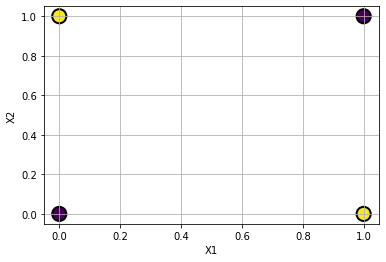

In [30]:
T = 1.
F = 0.

xx = [[1, F, F],
      [1, F, T],
      [1, T, F],
      [1, T, T]]

## XOR GATE
yy = [F,
      T,
      T,
      F]

xx = np.array(xx)
tt = np.array(yy)
x1 = xx[:,1]
x2 = xx[:,2]

%matplotlib inline
plt.scatter(x1, x2, c=tt, s=200, edgecolors='k', lw=2)
plt.grid()
plt.xlabel("X1")
plt.ylabel("X2")
plt.show()

Step: 0 -> Error: 2.0

Step: 2 -> Error: 2.0

Step: 4 -> Error: 2.0

Step: 6 -> Error: 1.0

Step: 8 -> Error: 1.0

Step: 10 -> Error: 2.0

Step: 12 -> Error: 2.0

Step: 14 -> Error: 2.0

Step: 16 -> Error: 1.0

Step: 18 -> Error: 2.0

Step: 20 -> Error: 2.0

Step: 22 -> Error: 2.0

Step: 24 -> Error: 2.0

Step: 26 -> Error: 2.0

Step: 28 -> Error: 2.0

Step: 30 -> Error: 2.0

Step: 32 -> Error: 2.0

Step: 34 -> Error: 2.0

Step: 36 -> Error: 2.0

Step: 38 -> Error: 1.0

Step: 40 -> Error: 2.0

Step: 42 -> Error: 2.0

Step: 44 -> Error: 2.0

Step: 46 -> Error: 2.0

Step: 48 -> Error: 1.0

Step: 50 -> Error: 1.0

Step: 52 -> Error: 1.0

Step: 54 -> Error: 1.0

Step: 56 -> Error: 2.0

Step: 58 -> Error: 2.0

Step: 60 -> Error: 2.0

Step: 62 -> Error: 2.0

Step: 64 -> Error: 2.0

Step: 66 -> Error: 2.0

Step: 68 -> Error: 3.0

Step: 70 -> Error: 3.0

Step: 72 -> Error: 2.0

Step: 74 -> Error: 3.0

Step: 76 -> Error: 2.0

Step: 78 -> Error: 2.0

Step: 80 -> Error: 2.0

Step: 82 -> Error: 2.

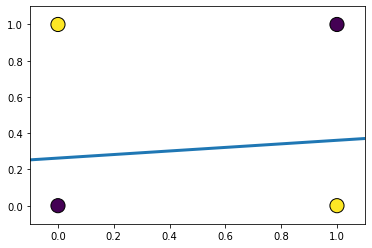

In [34]:
%matplotlib tk
fig = plt.figure()
ax = fig.add_subplot(111)

## Initialize weights
np.random.seed(2)
W = np.random.randn(3)

## sample points which makes mistake
## THis helps faster convergence... also better animation :D

err_indx = np.arange(0, len(xx), dtype=np.int64)

val_list = []
for step in range(100):
    indx = err_indx[np.random.randint(len(err_indx))]
    X = xx[indx]
    t = tt[indx]
    
    y = output(X, W)
    W = update(W, X, y, t, 0.05)
    
    err, err_indx  = total_error(xx, W, tt)
    if step%2 == 0 or len(err_indx)==0:
        
        val_list.append((step, W, err))
        print(f"Step: {step} -> Error: {err}")

        ax.clear()
        ax.scatter(x1, x2, c=tt, s=200, edgecolors='k', lw=2)
        
        #### plot decision boundary
        ax.set_xlim((x1.min()-0.1, x1.max()+0.1))
        ax.set_ylim((x2.min()-0.1, x2.max()+0.1))

        (x1min, x1max) = ax.get_xlim()
        x2min = (-W[0] - W[1]*x1min)/W[2]
        x2max = (-W[0] - W[1]*x1max)/W[2]
        ax.plot([x1min, x1max], [x2min, x2max], lw=3)

        fig.canvas.draw()
        plt.pause(0.01)
        
        print()
        if err < 1:
            print('fitted to our expectation')
            break

In [35]:
val_list

[(0, array([-0.41675785, -0.05626683, -2.1361961 ]), 2.0),
 (2, array([-0.31675785, -0.00626683, -2.0861961 ]), 2.0),
 (4, array([-0.21675785,  0.09373317, -2.0861961 ]), 2.0),
 (6, array([-0.11675785,  0.19373317, -2.0861961 ]), 1.0),
 (8, array([-0.01675785,  0.19373317, -1.9861961 ]), 1.0),
 (10, array([ 0.08324215,  0.19373317, -1.8861961 ]), 2.0),
 (12, array([ 0.18324215,  0.19373317, -1.7861961 ]), 2.0),
 (14, array([ 0.08324215,  0.19373317, -1.7861961 ]), 2.0),
 (16, array([-0.01675785,  0.19373317, -1.7861961 ]), 1.0),
 (18, array([ 0.08324215,  0.19373317, -1.6861961 ]), 2.0),
 (20, array([ 0.18324215,  0.19373317, -1.5861961 ]), 2.0),
 (22, array([ 0.08324215,  0.19373317, -1.5861961 ]), 2.0),
 (24, array([ 0.08324215,  0.19373317, -1.5361961 ]), 2.0),
 (26, array([ 0.18324215,  0.19373317, -1.4361961 ]), 2.0),
 (28, array([ 0.08324215,  0.19373317, -1.4361961 ]), 2.0),
 (30, array([ 0.08324215,  0.19373317, -1.3861961 ]), 2.0),
 (32, array([ 0.08324215,  0.19373317, -1.336

### Animate

In [37]:
num_points = 200
X1s = np.linspace(-0.2, 1.2, num_points)  ## for mesh grid
X2s = np.linspace(-0.2, 1.2, num_points)

x1g, x2g = np.meshgrid(X1s, X2s)

In [38]:
### Animation of Hebbian Learning
%matplotlib inline
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
plt.close()

def animate(i):
    global val_list
    if i%10 == 0:
        print(f'Step {i}')
    
    step, W, err = val_list[i] 
    
    ## Plot the function/decision boundary in 2D
    yg = [output(np.array([1, x1_, x2_]), W) for x1_, x2_ in zip(np.ravel(x1g), np.ravel(x2g))]
    yg = np.array(yg).reshape(x1g.shape)

    ax.clear()
    ax.imshow(yg.reshape(x1g.shape), interpolation='bicubic',
               extent=(x1g.min(), x1g.max(), x2g.min(), x2g.max()),
               cmap='plasma',
               alpha=0.5,
               aspect='auto', origin='lower')

    ax.scatter(x1, x2, c=tt, s=200, edgecolors='k', lw=2)
    
    ## Plot decision boundary as line
    (x1min, x1max) = -0.2, 1.2
    x2min = (-W[0] - W[1]*x1min)/W[2]
    x2max = (-W[0] - W[1]*x1max)/W[2]
    ax.plot([x1min, x1max], [x2min, x2max], lw=3, color='g')
    ax.set_xlim((x1min, x1max))
    ax.set_ylim((x1min, x1max))
    
    ax.grid()
    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.text(0.2,1.23, f"Steps: {step}  Error: {int(err)}")

        
anim = animation.FuncAnimation(fig, animate,frames=len(val_list),
                               init_func=lambda:None, interval=100)

In [39]:
anim

Step 0
Step 10
Step 20
Step 30
Step 40


In [40]:
writer_gif = animation.ImageMagickWriter(fps=10)
anim.save('Perceptron_XOR.gif', writer=writer_gif, dpi=100)

Step 0
Step 10
Step 20
Step 30
Step 40
